# Figure out plot and incorporate it into cross_channel.py

1. Plot of the map but with labelled lines
2. cross sections of the lines

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import LineString
import rasterio as rio
import pandas as pd

In [2]:
import sys
sys.path.append('/Users/home/whitefar/DATA/code/REMOTE_SENSING/ICESAT/')
from cross_channel import icesat_dataset

In [3]:
ds = icesat_dataset("/Volumes/arc_02/REMOTE_SENSING/ICESAT2/ds_subset_kamb.nc")

For this dataset
cycle number, corresponding number of points
5    613
3    613
1    613
6    613
4    613
2    613
Name: cycle_number, dtype: int64
cycle number, corresponding number of non NaN points
3    591
5    365
4    323
Name: cycle_number, dtype: int64


In [4]:
print(dir(ds))

['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'channel_mid', 'gda', 'gda_lines', 'getdata_alllines', 'getdata_line', 'is_lines', 'meta', 'plot_dhdt_crosssection', 'plot_dhdt_crosssection_map', 'plot_dhdt_map', 'plot_icesat_lines_map', 'plot_line_crosssection', 'plot_multiple_dhdt_crosssection', 'plot_multiple_dhdt_crosssection_map']


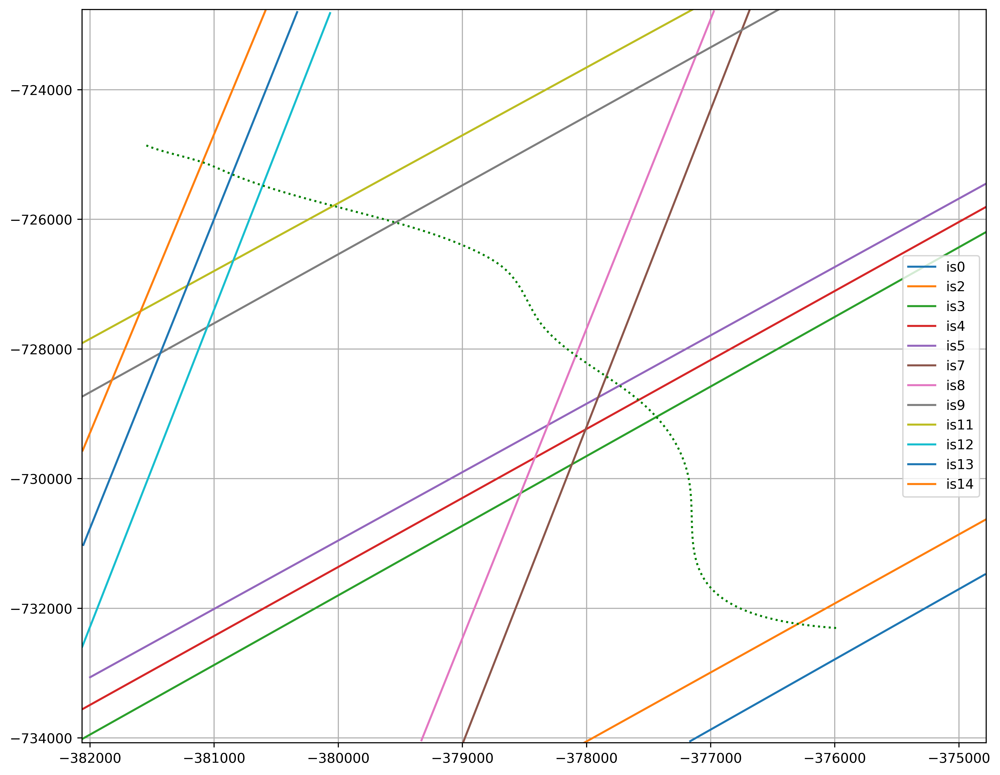

In [5]:
ds.plot_icesat_lines_map()


In [6]:
ds.getdata_alllines()

icesat_line_number  0.0   3.0   5.0    7.0   8.0   9.0   11.0  12.0  13.0  \
cycle_number                                                                
3.0                 29.0  21.0   4.0  124.0   3.0   1.0  86.0  85.0  20.0   
4.0                 29.0   NaN   4.0  124.0   NaN   1.0   NaN  85.0   NaN   
5.0                  NaN  21.0   4.0  124.0   NaN   1.0  86.0  85.0   1.0   

icesat_line_number  14.0  
cycle_number              
3.0                 34.0  
4.0                  NaN  
5.0                  NaN  


In [7]:
ds.getdata_alllines(buff=10)

icesat_line_number  0.0   2.0   3.0   4.0   5.0    7.0   8.0   9.0    11.0  \
cycle_number                                                                 
3.0                 64.0   5.0  43.0   5.0   9.0  248.0   6.0  18.0  173.0   
4.0                 64.0   5.0   1.0   5.0   9.0  248.0   NaN  17.0    NaN   
5.0                  1.0   1.0  43.0   1.0   9.0  248.0   NaN   2.0  172.0   

icesat_line_number   12.0  13.0   14.0  
cycle_number                            
3.0                 172.0  40.0  155.0  
4.0                 171.0   NaN    NaN  
5.0                 171.0   2.0    1.0  


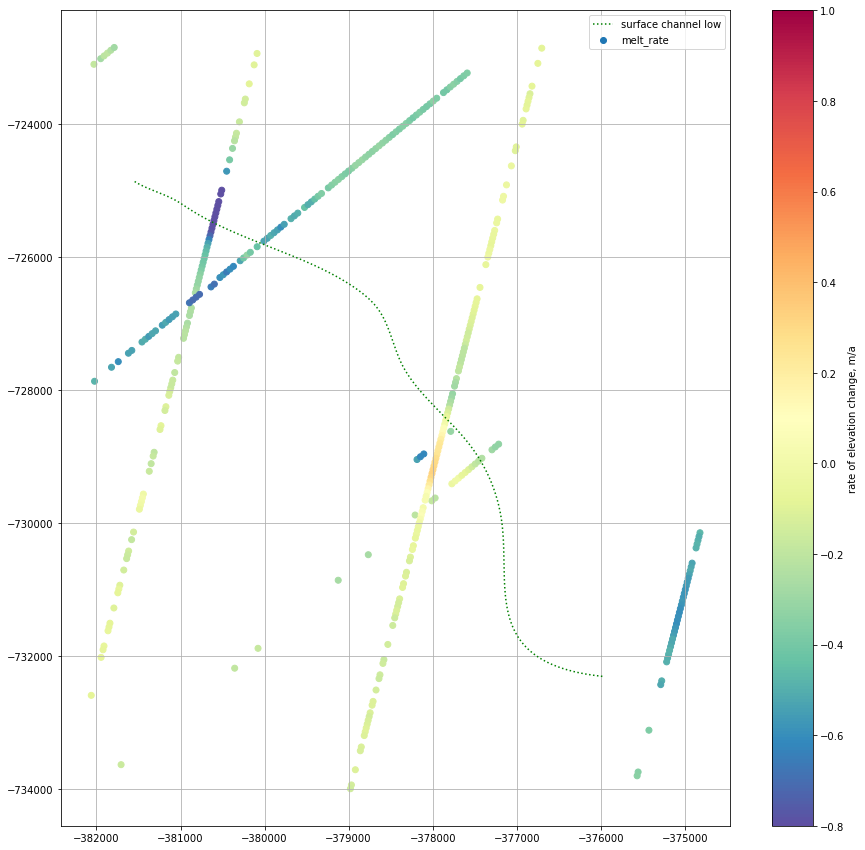

In [8]:
ds.plot_dhdt_map(cycle_number_from=3,cycle_number_till=5)

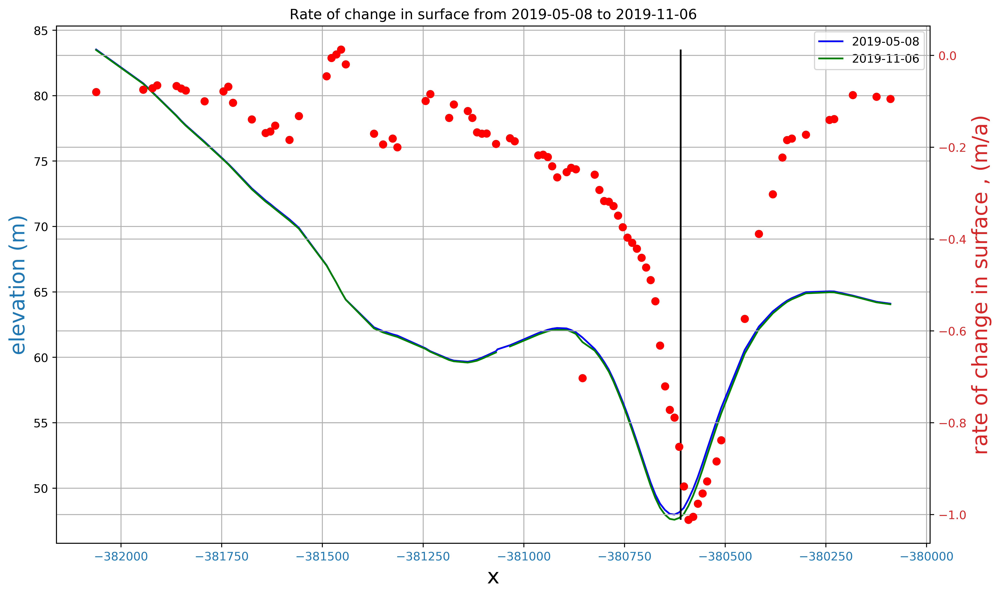

In [9]:
ds.plot_dhdt_crosssection(icesat_line_number=12,cycle_number_from=3,cycle_number_till=5)

### Commentary

Clearly surface downwasting over the cha cha channel, and even more upstream

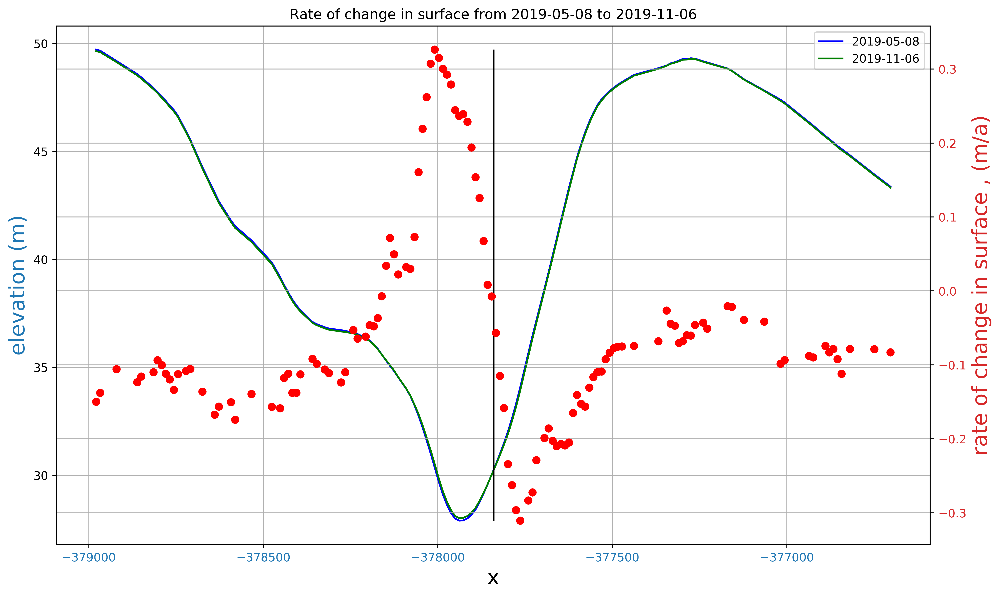

In [10]:
ds.plot_dhdt_crosssection(icesat_line_number=7,cycle_number_from=3,cycle_number_till=5)

### Commentary

positive and negative, zero right on the channel. looks like meandering.

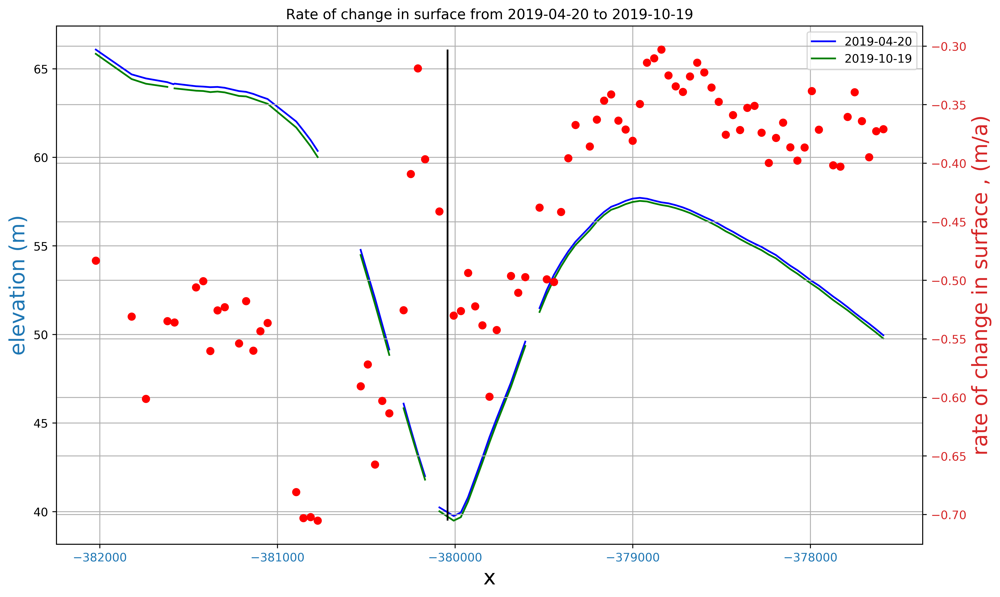

In [11]:
ds.plot_dhdt_crosssection(icesat_line_number=11,cycle_number_from=3,cycle_number_till=5)

### Commentary

Looks like downwasting/melt, with less melt on glacier right of channel


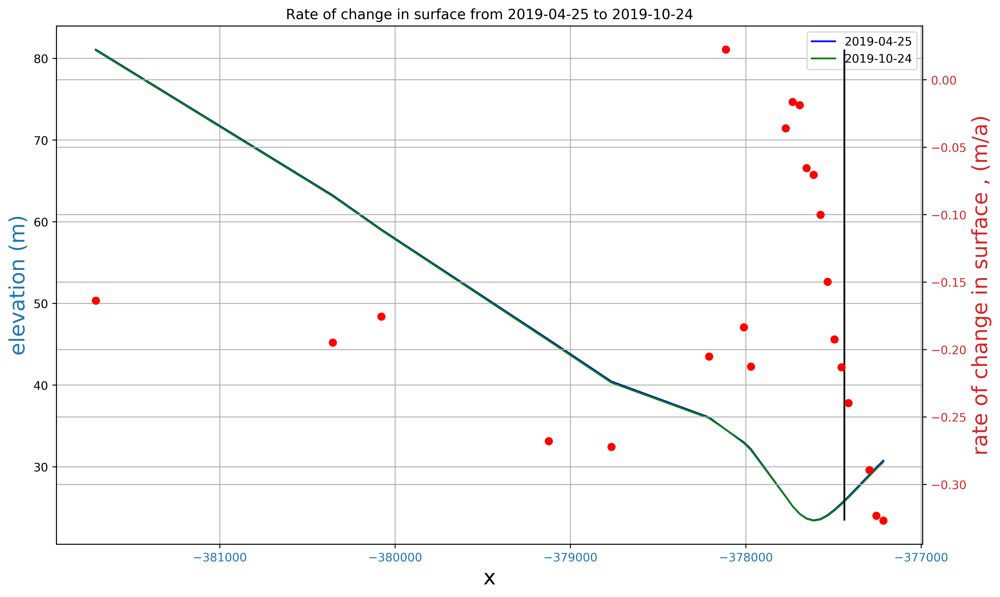

In [12]:
ds.plot_dhdt_crosssection(icesat_line_number=3,cycle_number_from=3,cycle_number_till=5)

### Commentary

Looks like downwasting/melt, with less melt on glacier right of channel

No accretion/upwelling observed

## Now figuring out a plot to integrate icesat2 map and cross sections

### part one: map with labeled boxes

In [11]:
cycle_number_from=3
cycle_number_till=5
# This dataframe has h_corr from cycle_number_from, and dhdt. Times are from cycle_number_from
dadh = gpd.GeoDataFrame( ds.gda[ds.gda.cycle_number==cycle_number_from],geometry=ds.gda.geometry )

In [12]:
dadh['dh'] =(ds.gda[ds.gda.cycle_number==cycle_number_from].h_corr.to_numpy() -
                      ds.gda[ds.gda.cycle_number==cycle_number_till].h_corr.to_numpy())

In [13]:
# get the time in years between data points
dadh['dt'] = (ds.gda[ds.gda.cycle_number==cycle_number_till].utc_time.to_numpy()  - 
                  ds.gda[ds.gda.cycle_number==cycle_number_from].utc_time.to_numpy()  ) 
dadh.dt = dadh.dt /  np.timedelta64(1, 'Y')

In [14]:
dadh['dhdt'] = dadh['dh'].to_numpy() / dadh['dt'].to_numpy()        

In [15]:
#up and down refer to where the label goes
icesat_lines = [[12,'up'],[11,'down'],[7,'up'],[3,'up']]

In [16]:
dict_entrys = [[f'is{icesat_line_number[0]}',icesat_line_number[1]] for icesat_line_number in icesat_lines]

In [17]:
buff=300

In [18]:
polygons = [[ds.is_lines[dict_entry[0]].buffer(300),dict_entry[1]] for dict_entry in dict_entrys]

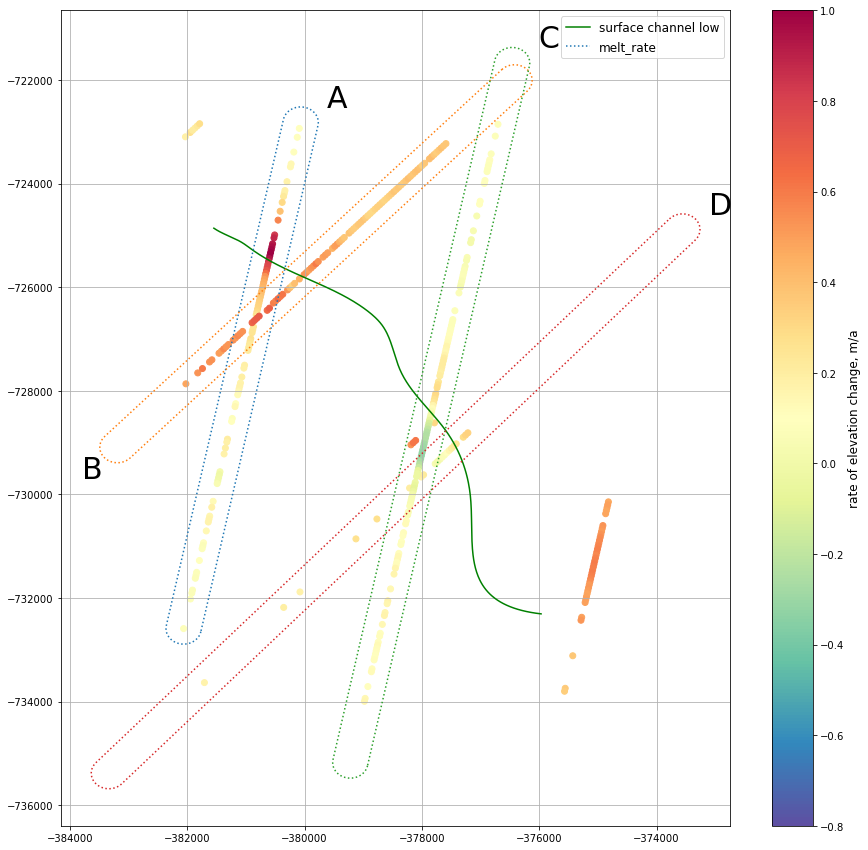

In [21]:

plt.figure(figsize=(15,15))
plt.scatter(dadh.x,dadh.y,c=dadh.dhdt,cmap='Spectral_r',vmin=-0.8, vmax=1)
plt.plot(ds.channel_mid.geometry.x,ds.channel_mid.geometry.y,'g-')
i=65
for polygon, text_loc in polygons:   
    
    plt.plot(polygon.exterior.xy[0],polygon.exterior.xy[1],':',label='is polygon')
    if text_loc == 'up':
        plt.text(np.max(polygon.exterior.xy[0]) + buff/2,np.max(polygon.exterior.xy[1]),chr(i),size=30)
    elif text_loc == 'down':
            plt.text(np.min(polygon.exterior.xy[0])- buff,np.min(polygon.exterior.xy[1])- buff,chr(i),size=30)
    i += 1
plt.legend(['surface channel low','melt_rate'],fontsize=12)
cb = plt.colorbar()
cb.set_label('rate of elevation change, m/a',fontsize=12)
plt.grid()
plt.show()

### part two: cross sections

In [22]:
dict_entrys

[['is12', 'up'], ['is11', 'down'], ['is7', 'up'], ['is3', 'up']]

In [23]:
icesat_line_numbers = [b[0] for b in icesat_lines]

# if data over that line hasnt been found using getdataline or all_lines, find it.
dict_entrys = [f'is{icesat_line_number[0]}' for icesat_line_number in icesat_lines]

In [24]:
gda_line_diffs = []
point_midchannels = []

for icesat_line_number in icesat_line_numbers:
    # if data over that line hasnt been found using getdataline or all_lines, find it.
    dict_entry = f'is{icesat_line_number}'
    try:
        gda_line = ds.gda_lines[dict_entry]
    except KeyError:
        ds.getdata_line(icesat_line_number)
        gda_line = ds.gda_lines[dict_entry]

    for cycle in [cycle_number_from,cycle_number_till]:
        try:
            gda_line.dropna(axis='index',subset=['h_corr']).cycle_number.value_counts().loc[cycle]
        except KeyError:
            print(f'There is no data for line {icesat_line_number}, cycle {cycle}')
            continue

    point_midchannel = np.array( LineString(gda_line.geometry.tolist()).intersection(LineString(ds.channel_mid.geometry.tolist())) ) 

    point_midchannels.append( np.mean(point_midchannel,axis=0) )


   # This dataframe has h_corr from cycle_number_from, and dhdt. Times are from cycle_number_from
    gda_line_diff = gpd.GeoDataFrame( gda_line[gda_line.cycle_number==cycle_number_from],geometry=gda_line.geometry ).reset_index(drop=True)
    gda_line_diff.rename(columns={"h_corr": f"h_corr_cycle_{cycle_number_from}"}, inplace=True)
    gda_line_diff[f"h_corr_cycle_{cycle_number_till}"] = gda_line[gda_line.cycle_number==cycle_number_till].h_corr.reset_index(drop=True)


    gda_line_diff['dh'] =- (gda_line[gda_line.cycle_number==cycle_number_from].h_corr.to_numpy() -
                          gda_line[gda_line.cycle_number==cycle_number_till].h_corr.to_numpy())

    # get the time in years between data points
    gda_line_diff['dt'] = (gda_line[gda_line.cycle_number==cycle_number_till].utc_time.to_numpy()  - 
                      gda_line[gda_line.cycle_number==cycle_number_from].utc_time.to_numpy()  ) 
    gda_line_diff.dt = gda_line_diff.dt /  np.timedelta64(1, 'Y')

    gda_line_diff['dhdt'] = gda_line_diff['dh'].to_numpy()/gda_line_diff['dt'].to_numpy()
    
    gda_line_diffs.append(gda_line_diff)
    del gda_line_diff


In [25]:
n_plots = len(gda_line_diffs)

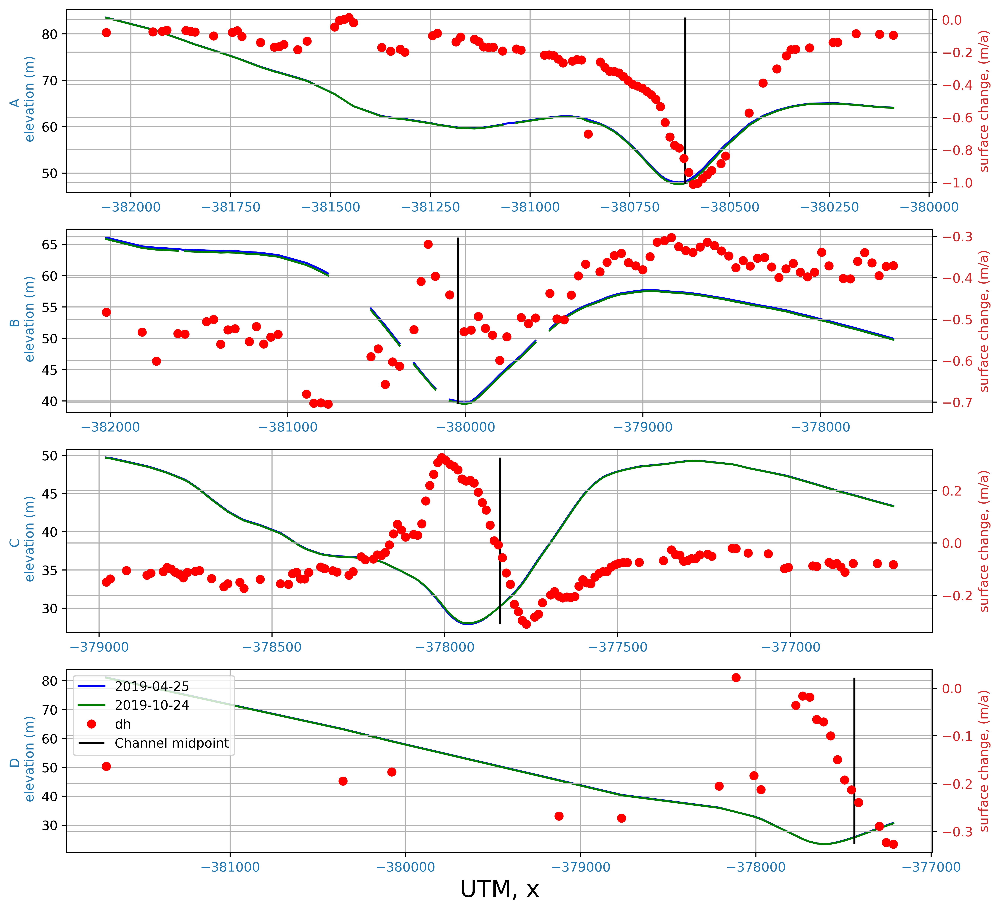

In [26]:
fig, ax = plt.subplots(n_plots,1,figsize=(12,3*n_plots),dpi=500)

i= 65
for ax1,gda_line_diff,point_midchannel in zip(ax,gda_line_diffs,point_midchannels):

    color = 'tab:blue'

    ax1.set_ylabel(f'{chr(i)} \n elevation (m)', color=color,fontsize=10)
    i += 1

    ax1.plot(gda_line_diff.sort_values(by ='x' ).x,
             gda_line_diff.sort_values(by ='x' )[f"h_corr_cycle_{cycle_number_from}"],'b-',
            label = f"{gda_line[gda_line.cycle_number==cycle_number_from].utc_time.mean().date()}")

    ax1.plot(gda_line_diff.sort_values(by ='x' ).x,
             gda_line_diff.sort_values(by ='x' )[f"h_corr_cycle_{cycle_number_till}"],'g-',
            label = f"{gda_line[gda_line.cycle_number==cycle_number_till].utc_time.mean().date()}")

    ax1.tick_params(axis='x', labelcolor=color)
    
    ax1.grid()
#     ax1.legend()

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:red'
     # we already handled the x-label with ax1
    ax2.plot(gda_line_diff.x,gda_line_diff.dhdt,'ro', label='dh')
    ax2.vlines(point_midchannel[0],gda_line_diff.dhdt.min(),gda_line_diff.dhdt.max(),label='Channel midpoint')

    ax2.tick_params(axis='y', labelcolor=color)
    ax2.grid()
    ax2.set_ylabel('surface change, (m/a)', color=color,fontsize=10)
    
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc=0)
    
    
ax1.set_xlabel('UTM, x',fontsize=18)

#     fig.tight_layout()  # otherwise the right y-label is slightly clipped

plt.show()

## test new use of cross_channel with new plots


In [27]:
icesat_lines = [[12,'up'],[11,'down'],[7,'up'],[3,'up']]

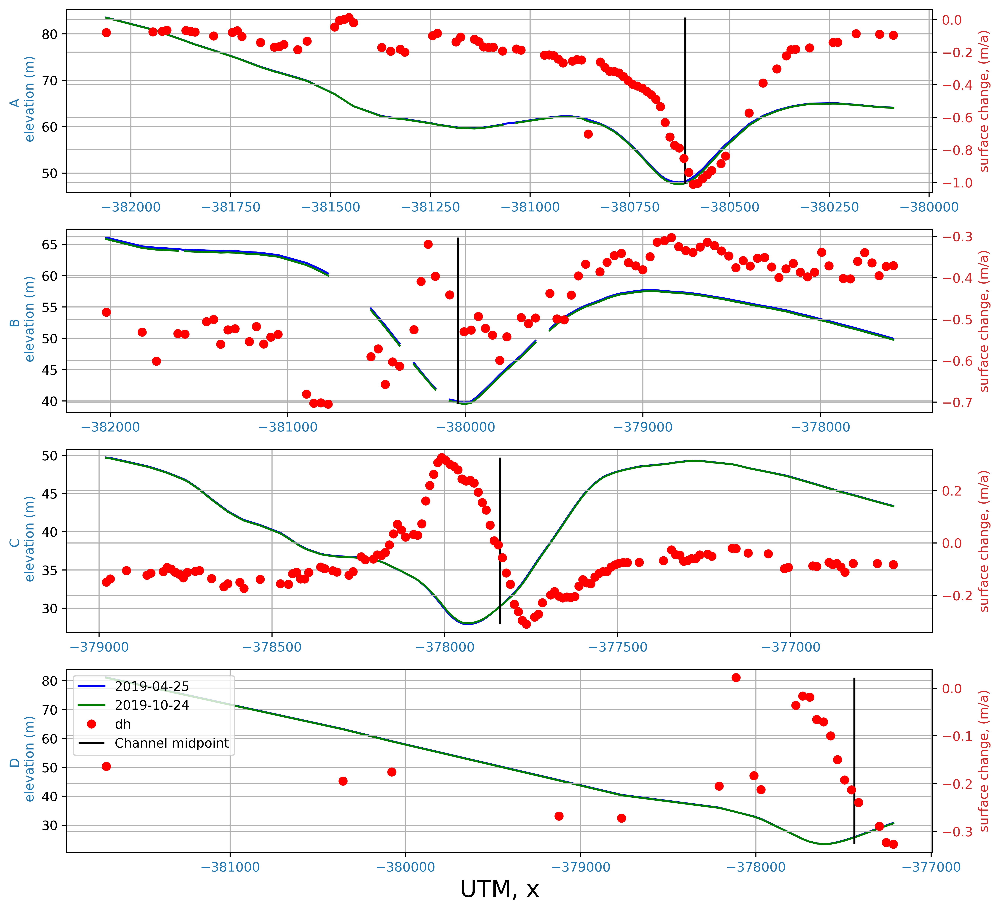

In [28]:
ds.plot_multiple_dhdt_crosssection_map(cycle_number_from,cycle_number_till,icesat_lines)

# try quantify meander

In [30]:
%matplotlib qt
ds.plot_dhdt_crosssection(icesat_line_number=11,cycle_number_from=3,cycle_number_till=5)

# plot rema diff with icesat2 diff

In [8]:
#load REMA
nid1 = 159202  # 2012-12-24
nid2 = 131226  # 2016-11-09
df = gpd.read_file('/Users/home/whitefar/DATA/REMOTE_SENSING/REMA_2m_strips/REMA_Strip_Index_Rel1.shp')
path = f"/Volumes/arc_02/whitefar/DATA/REMOTE_SENSING/REMA_STRIPES/DIFFERENCES/REMA_{nid1}-{nid2}_diff.tif"
f = df.loc[nid1].acquisitio
t =df.loc[nid2].acquisitio
duration = (pd.to_datetime(t)-pd.to_datetime(f)).days/365.25
with rio.open(path) as image:
    im = image.read(1)
    im[im==-9999] = np.nan
    im = im / duration

In [9]:
points_x = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/points_x_channel.npy')
points_y = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/points_y_channel.npy') 

<Figure size 1080x1080 with 0 Axes>

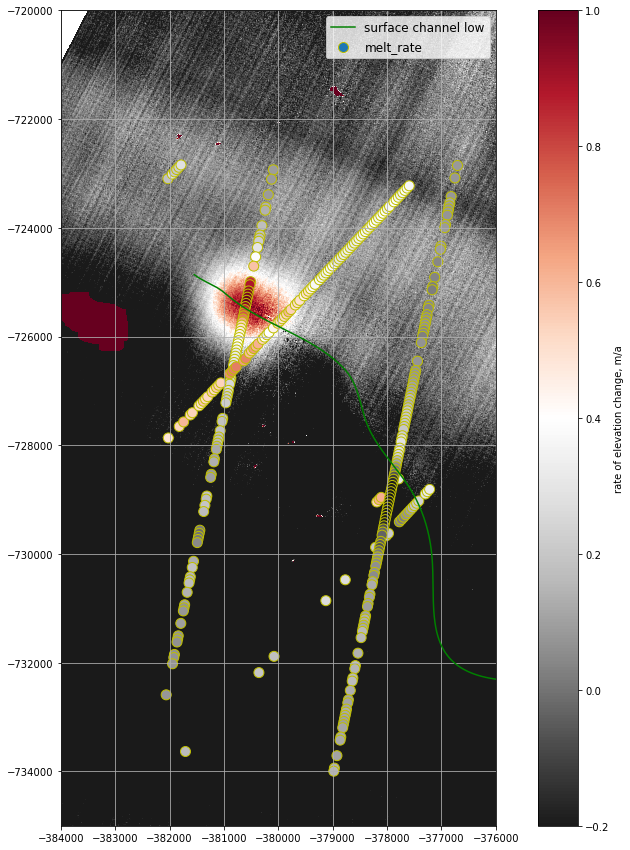

In [31]:
plt.figure(figsize=(15,15))

extent_REMA1 = [image.bounds[0],image.bounds[2],image.bounds[1],image.bounds[3]]
plt.figure(figsize=(15,15))
GyRd = plt.cm.get_cmap('RdGy').reversed()
plt.imshow(im,extent=extent_REMA1, vmin=-0.2,vmax=1,cmap=GyRd)
cb = plt.colorbar()
cb.set_label('rate of elevation change, m/a')

plt.scatter(dadh.x,dadh.y,c=dadh.dhdt,cmap=GyRd,vmin=-0.2, vmax=1, edgecolors='y',s=300)
plt.plot(ds.channel_mid.geometry.x,ds.channel_mid.geometry.y,'g-')
i=65
# for polygon, text_loc in polygons:   
    
#     plt.plot(polygon.exterior.xy[0],polygon.exterior.xy[1],':',label='is polygon')
#     if text_loc == 'up':
#         plt.text(np.max(polygon.exterior.xy[0]) + buff/2,np.max(polygon.exterior.xy[1]),chr(i),size=30)
#     elif text_loc == 'down':
#             plt.text(np.min(polygon.exterior.xy[0])- buff,np.min(polygon.exterior.xy[1])- buff,chr(i),size=30)
#     i += 1
plt.legend(['surface channel low','melt_rate'],fontsize=12)
plt.grid()
plt.xlim([-384000, -376000])
plt.ylim([-735000,-720000])
plt.show()

<Figure size 1080x1080 with 0 Axes>

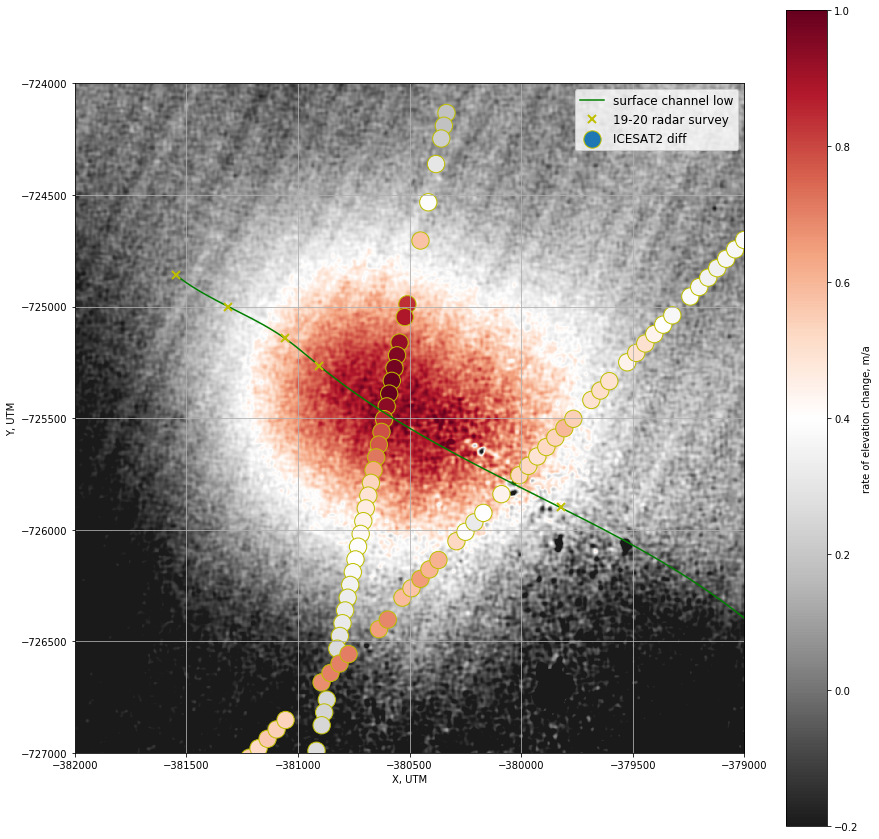

In [21]:
plt.figure(figsize=(15,15))

extent_REMA1 = [image.bounds[0],image.bounds[2],image.bounds[1],image.bounds[3]]
plt.figure(figsize=(15,15))
GyRd = plt.cm.get_cmap('RdGy').reversed()
plt.imshow(im,extent=extent_REMA1, vmin=-0.2,vmax=1,cmap=GyRd,label='REMA diff')
cb = plt.colorbar()
cb.set_label('rate of elevation change, m/a')

plt.scatter(dadh.x,dadh.y,c=dadh.dhdt,cmap=GyRd,vmin=-0.2, vmax=1, edgecolors='y',s=300,label='ICESAT2 diff')
plt.plot(ds.channel_mid.geometry.x,ds.channel_mid.geometry.y,'g-',label='surface channel low')
# plt.plot(points_x[0,:],points_y[0,:],'yx',label="19-20 radar survey",markersize=8,markeredgewidth=2)
# plt.plot(points_x[-1,:],points_y[-1,:],'yx',label="19-20 radar survey",markersize=8,markeredgewidth=2)
plt.plot(points_x[10,:],points_y[10,:],'yx',label="19-20 radar survey",markersize=8,markeredgewidth=2)

plt.legend(fontsize=12)
plt.grid()
plt.xlim([-382000, -379000])
plt.ylim([-727000,-724000])
plt.xlabel('X, UTM')
plt.ylabel('Y, UTM')
plt.savefig('/Users/home/whitefar/ASSIGNMENTS-PUBLICATIONS-TALKS/channel_data_writeup/PLOTS/diff_icesat_rema.png')
plt.show()

## Plot with minimum ice thickness in the channel
ie the first low after the start of the channel

this has index=39 (found at DATA/Jupyter/RADAR/RADAR_MAP/29_RADAR_plots_for_present.ipynb)

<Figure size 1080x1080 with 0 Axes>

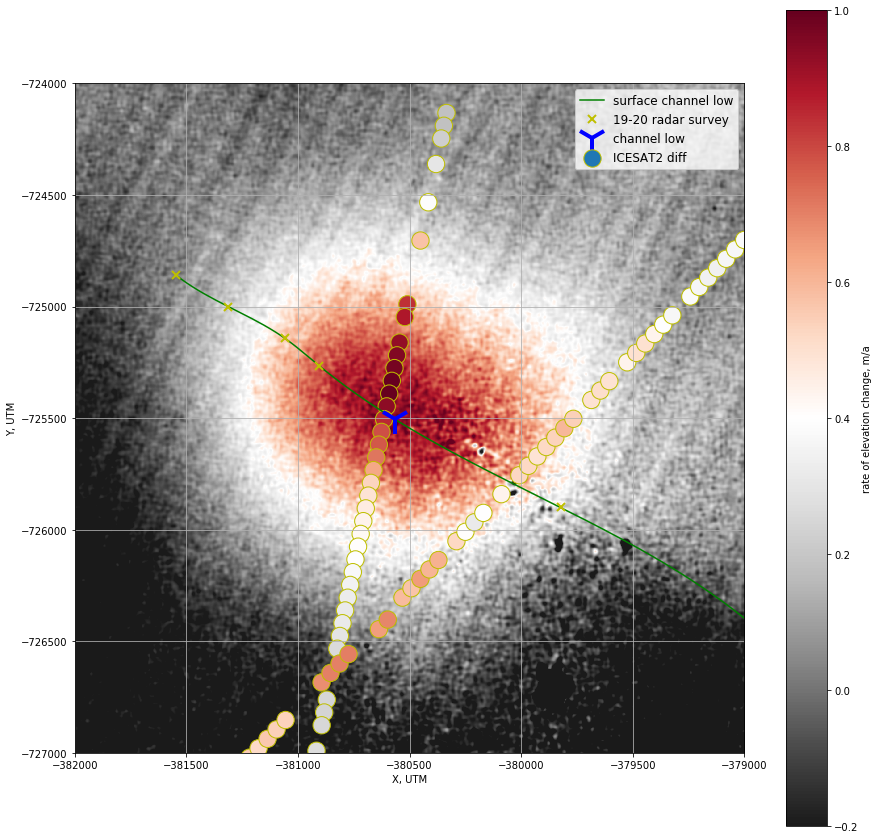

In [33]:
plt.figure(figsize=(15,15))

extent_REMA1 = [image.bounds[0],image.bounds[2],image.bounds[1],image.bounds[3]]
plt.figure(figsize=(15,15))
GyRd = plt.cm.get_cmap('RdGy').reversed()
plt.imshow(im,extent=extent_REMA1, vmin=-0.2,vmax=1,cmap=GyRd,label='REMA diff')
cb = plt.colorbar()
cb.set_label('rate of elevation change, m/a')

plt.scatter(dadh.x,dadh.y,c=dadh.dhdt,cmap=GyRd,vmin=-0.2, vmax=1, edgecolors='y',s=300,label='ICESAT2 diff')

plt.plot(ds.channel_mid.geometry.x,ds.channel_mid.geometry.y,'g-',label='surface channel low')

plt.plot(points_x[10,:],points_y[10,:],'yx',label="19-20 radar survey",markersize=8,markeredgewidth=2)

plt.plot(ds.channel_mid.geometry.x.iloc[39],ds.channel_mid.geometry.y.iloc[39],'b1',label="channel low",markersize=30,markeredgewidth=4)

plt.legend(fontsize=12)
plt.grid()
plt.xlim([-382000, -379000])
plt.ylim([-727000,-724000])
plt.xlabel('X, UTM')
plt.ylabel('Y, UTM')
plt.savefig('/Users/home/whitefar/ASSIGNMENTS-PUBLICATIONS-TALKS/channel_data_writeup/PLOTS/diff_icesat_rema.png')
plt.show()

In [34]:
-382000 - -379000

-3000

In [32]:
-727000 - -724000

-3000